In [8]:
#Imports
import numpy as np
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn import tree
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
%matplotlib inline
plt.rcParams['figure.figsize'] = (10, 6)
plt.style.use('ggplot')

import seaborn as sns

In [9]:
#Reading data
#data = pd.read_csv("language_data.csv")
data = pd.read_csv('data/cleaned/language_data.csv')
data.head(10)

,wals_code,iso_code,glottocode,Name,latitude,longitude,genus,family,macroarea,countrycodes,...,58B Number of Possessive Nouns_2 One,58B Number of Possessive Nouns_3 Two to four,58B Number of Possessive Nouns_4 Five or more,58B Number of Possessive Nouns_nan,79B Suppletion in Imperatives and Hortatives_1 A regular and a suppletive form alternate,79B Suppletion in Imperatives and Hortatives_2 Imperative,79B Suppletion in Imperatives and Hortatives_3 Hortative,79B Suppletion in Imperatives and Hortatives_4 Imperative and Hortative,79B Suppletion in Imperatives and Hortatives_5 None (= no suppletive imperatives reported in the reference material),79B Suppletion in Imperatives and Hortatives_nan
0,aab,NaN,NaN,Arapesh (Abu),-3.450000,142.950000,Kombio-Arapesh,Torricelli,NaN,PG,...,0,0,0,1,0,0,0,0,0,1
1,aar,aiw,aari1239,Aari,6.000000,36.583333,South Omotic,Afro-Asiatic,Africa,ET,...,0,0,0,1,0,0,0,0,0,1
2,aba,aau,abau1245,Abau,-4.000000,141.250000,Upper Sepik,Sepik,Papunesia,PG,...,0,0,0,1,0,0,0,0,0,1
3,abb,shu,chad1249,Arabic (Chadian),13.833333,20.833333,Semitic,Afro-Asiatic,Africa,TD,...,0,0,0,1,0,0,0,0,0,1
4,abd,abi,abid1235,Abidji,5.666667,-4.583333,Kwa,Niger-Congo,Africa,CI,...,0,0,0,1,0,0,0,0,0,1
5,abe,apc,nort3139,Arabic (Beirut),33.916667,35.500000,Semitic,Afro-Asiatic,Eurasia,LB,...,0,0,0,1,0,0,0,0,0,1
6,abh,abv,baha1259,Arabic (Bahrain),26.000000,50.500000,Semitic,Afro-Asiatic,Eurasia,BH,...,0,0,0,1,0,0,0,0,0,1
7,abi,axb,abip1241,Abipón,-29.000000,-61.000000,South Guaicuruan,Guaicuruan,South America,AR,...,0,0,0,1,0,0,0,0,0,1
8,abk,abk,abkh1244,Abkhaz,43.083333,41.000000,Northwest Caucasian,Northwest Caucasian,Eurasia,GE,...,0,0,0,0,0,0,0,0,1,0
9,abm,akz,alab1237,Alabama,32.333333,-87.416667,Muskogean,Muskogean,North America,US,...,0,0,0,1,0,0,0,0,0,1


In [10]:
largest_families = ['Sino-Tibetan',
                  'Trans-New Guinea',
                  'Indo-European',
                  'Niger-Congo',
                  'Austronesian',
                  'Afro-Asiatic'] 

data_families = data.loc[data['family'].isin(largest_families)]

In [16]:
#Saving features

features = data.iloc[:,range(267,1597)]
features.describe()

#Let's save the feature names

feature_names = features.columns.to_list()

**Begining of Analysis**

Here I …

In [17]:
#As we increase max depth, how does the accuracy of the classifier chance? Let's start with Indo-European.

for i in np.arange(1,10):
    decisionTree = tree.DecisionTreeClassifier(max_depth=i)
    decisionTree = decisionTree.fit(features, data['Indo-European'])
    y_pred = decisionTree.predict(features)
    print("max depth: ",i," accuracy: ",metrics.accuracy_score(y_true = data['Indo-European'], y_pred = y_pred))

max depth:  1  accuracy:  0.9384098544232923
max depth:  2  accuracy:  0.9466218738335199
max depth:  3  accuracy:  0.948488241881299
max depth:  4  accuracy:  0.9533407988055245
max depth:  5  accuracy:  0.9567002612915267
max depth:  6  accuracy:  0.9600597237775289
max depth:  7  accuracy:  0.9615528182157521
max depth:  8  accuracy:  0.9637924598730869
max depth:  9  accuracy:  0.9649122807017544


Wow, those are pretty good results! So what do those trees look like? What features does it find important? What languages does it misclassify?

In [27]:
#Now let's make a decision tree, starting again with Indo-European using a max depth of 3

decisionTree = tree.DecisionTreeClassifier(max_depth=3, min_samples_split=30)

decisionTree = decisionTree.fit(features, data['Indo-European'])

y_pred = decisionTree.predict(features)

print(metrics.accuracy_score(y_true = data['Indo-European'], y_pred = y_pred))

#Printing the tree—I will make another visualization soon!
print(tree.export_text(decisionTree, feature_names = feature_names))

#Printing which languages were misclassified
misclassified = []
for i in np.arange(len(features)):
    a = decisionTree.predict(features)[i]
    language_name = data['Name'].to_list()[i]
    True_value = data['Indo-European'].to_list()[i]
    True_data = data.loc[data['Name'] == language_name][['Name','family','countrycodes','genus','macroarea']]
    if True_value != a:
        print("misclassified:",language_name, "\n   true family: ", True_data['family'].to_string(index=False))
        misclassified.append(language_name)

0.9477416946621874
|--- 53A Ordinal Numerals_7 First, second, three-th <= 0.50
|   |--- 54A Distributive Numerals_5 Marked by preceding word <= 0.50
|   |   |--- 54A Distributive Numerals_1 No distributive numerals <= 0.50
|   |   |   |--- class: 0
|   |   |--- 54A Distributive Numerals_1 No distributive numerals >  0.50
|   |   |   |--- class: 0
|   |--- 54A Distributive Numerals_5 Marked by preceding word >  0.50
|   |   |--- class: 1
|--- 53A Ordinal Numerals_7 First, second, three-th >  0.50
|   |--- 57A Position of Pronominal Possessive Affixes_2 Possessive suffixes <= 0.50
|   |   |--- 138A Tea_nan <= 0.50
|   |   |   |--- class: 1
|   |   |--- 138A Tea_nan >  0.50
|   |   |   |--- class: 0
|   |--- 57A Position of Pronominal Possessive Affixes_2 Possessive suffixes >  0.50
|   |   |--- class: 0

misclassified: Afrikaans 
   true family:  Indo-European
misclassified: Alsatian 
   true family:  Indo-European
misclassified: Armenian (Eastern) 
   true family:  Indo-European
misclas

What does features does this decision tree include? How languages handle numbers, possesive suffixes. Also tea—but not in a meaningful way, since it classifies them on whether the feauture tea was given any value.

Most of the languages it misclassifies are Indo-European. The exceptions include Estonian and Tuvaluan. Many of the misclassified Indo-European languages are small and don't have many features reported. I suspect this lack of information about them leads to their misclassification.

Our biggest challenge is the incompleteness of the data we are working with. Depsite that, the numbers indicate the model works quite well. I am honestly surprised!

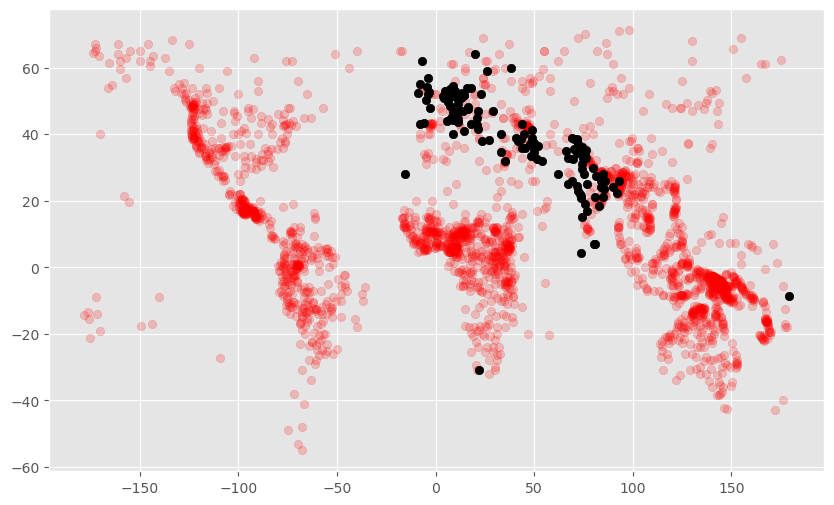

In [30]:
misclassified_dataset = data.loc[data['Name'].isin(misclassified)]

plt.scatter(data['longitude'],data['latitude'],c='r',alpha=0.2)
plt.scatter(misclassified_dataset['longitude'],misclassified_dataset['latitude'],c='black')
plt.show()

In [32]:
print('number of indo-european classified otherwise:',len(misclassified_dataset.loc[misclassified_dataset['family'] == "Indo-European"]))
print('number of non-indo-european classified as indo-european:',len(misclassified_dataset.loc[misclassified_dataset['family'] != "Indo-European"]))
print(misclassified_dataset.loc[misclassified_dataset['family'] != "Indo-European"].Name.to_list())

number of indo-european classified otherwise: 138
number of non-indo-european classified as indo-european: 2
['Estonian', 'Tuvaluan']


**Going Deeper**

In [34]:
#let's define some convenient functions

def language_tree_accuracy(family,max_depth=1,min_samples_split=2):
    X = data[feature_names].values
    y = data[family].values

    Xtrain, Xtest, Ytrain, Ytest = train_test_split(X, y, random_state=1, test_size=0.8)
    decisionTree = tree.DecisionTreeClassifier(max_depth=max_depth,min_samples_split=min_samples_split)
    decisionTree = decisionTree.fit(Xtrain, Ytrain)
    y_pred_test = decisionTree.predict(Xtest)
    y_pred_train = decisionTree.predict(Xtrain)
    result = [metrics.accuracy_score(y_true = Ytrain, y_pred = y_pred_train), metrics.accuracy_score(y_true = Ytest, y_pred = y_pred_test)]
    return result

def language_tree(family,max_depth=1,min_samples_split=2):
    X = data[feature_names].values
    y = data[family].values

    Xtrain, Xtest, Ytrain, Ytest = train_test_split(X, y, random_state=1, test_size=0.8)
    decisionTree = tree.DecisionTreeClassifier(max_depth=max_depth,min_samples_split=min_samples_split)
    decisionTree = decisionTree.fit(Xtrain, Ytrain)
    y_pred_test = decisionTree.predict(Xtest)
    y_pred_train = decisionTree.predict(Xtrain)
    result = tree.export_text(decisionTree, feature_names = feature_names)
    return result

def draw_tree(family,max_depth=1,min_samples_split=2):
    X = data[feature_names].values
    y = data[family].values

    Xtrain, Xtest, Ytrain, Ytest = train_test_split(X, y, random_state=1, test_size=0.8)
    decisionTree = tree.DecisionTreeClassifier(max_depth=max_depth,min_samples_split=min_samples_split)
    model = decisionTree.fit(Xtrain, Ytrain)

    fig = plt.figure(figsize=(20,7*(max_depth) ** 1/2))
    _ = tree.plot_tree(decisionTree,
                   feature_names=feature_names,
                   class_names=[family,"Else"],
                   filled=True,
                  fontsize = 10,
                   rounded = True, proportion = False,
                  label = 'root')
    plt.show()

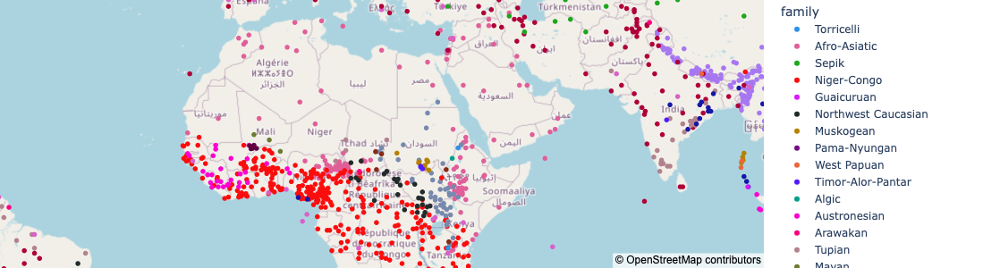

In [43]:
#Let's also make some nicer maps!

#Here's a map of languages by family

import plotly.express as px

fig = px.scatter_map(data,lat="latitude", lon="longitude", hover_name="Name", hover_data=["genus", "family"],
                        color = 'family', zoom=3, height=300, color_discrete_sequence=px.colors.qualitative.Dark24)
fig.update_layout(map_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Onto a more systematic exploration!

Let's explore each of the major language families, each using max depth of 4 and minimum samples split of 20.

0.9397919863300321


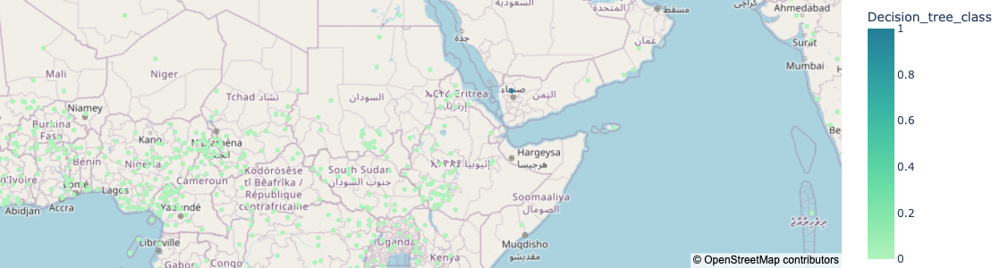

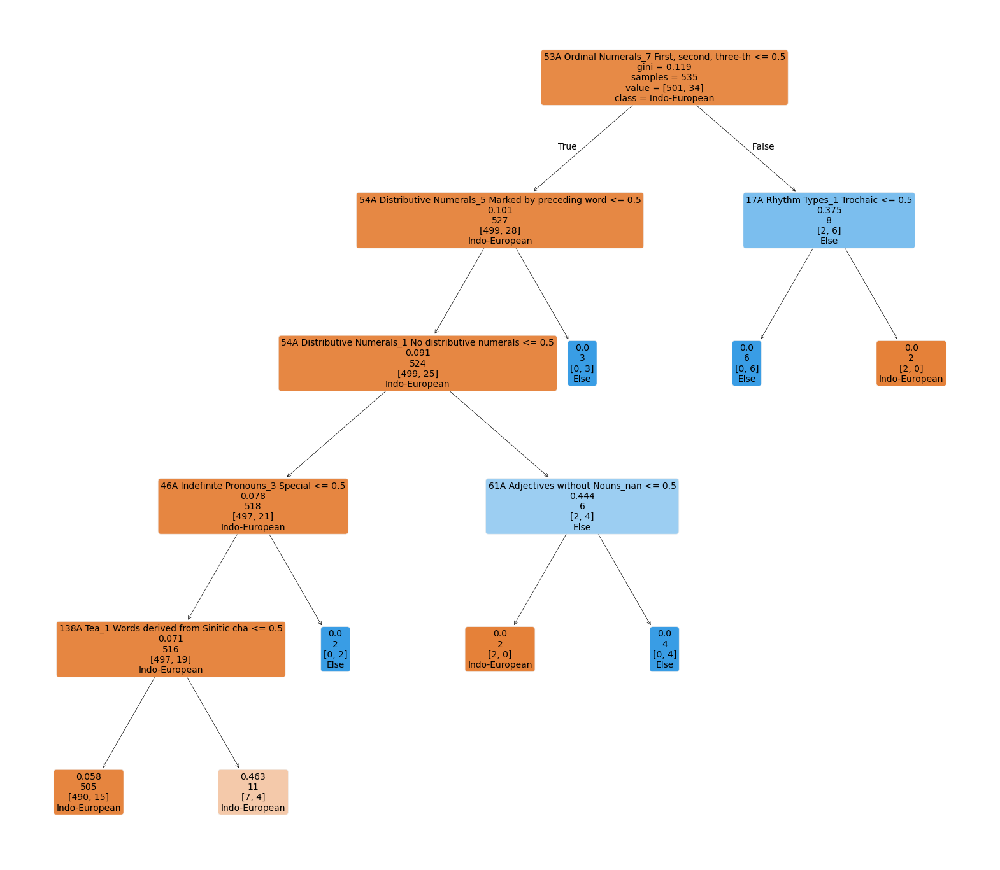

In [48]:
#Indo-European

print(np.mean(language_tree_accuracy('Indo-European',4,20)))

decisionTree = tree.DecisionTreeClassifier(max_depth=5)

decisionTree = decisionTree.fit(features, data['Indo-European'])

data['Decision_tree_class'] = decisionTree.predict(features)

fig = px.scatter_map(data,lat="latitude", lon="longitude", hover_name="Name", hover_data=["genus", "family",'Decision_tree_class'],
                        color = 'Decision_tree_class', zoom=3, height=300, color_continuous_scale=px.colors.sequential.Tealgrn)
fig.update_layout(map_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

draw_tree('Indo-European',5)

0.9577630248291253


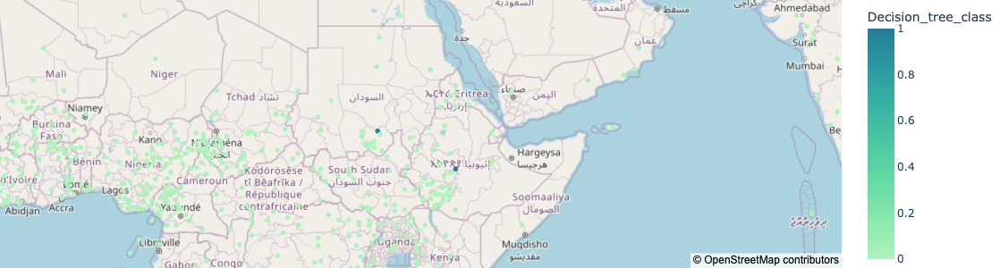

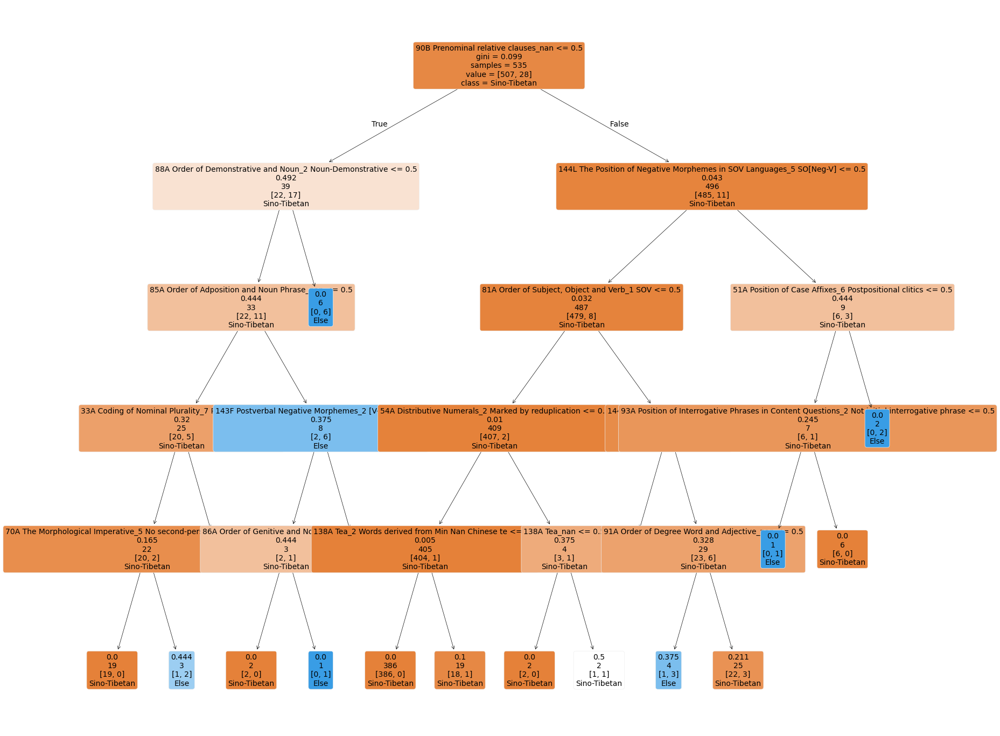

In [74]:
#Sino-Tibetan

print(np.mean(language_tree_accuracy('Sino-Tibetan',4,20)))

decisionTree = tree.DecisionTreeClassifier(max_depth=5)

decisionTree = decisionTree.fit(features, data['Sino-Tibetan'])

data['Decision_tree_class'] = decisionTree.predict(features)

fig = px.scatter_map(data,lat="latitude", lon="longitude", hover_name="Name", hover_data=["genus", "family",'Decision_tree_class'],
                        color = 'Decision_tree_class', zoom=3, height=300, color_continuous_scale=px.colors.sequential.Tealgrn)
fig.update_layout(map_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

draw_tree('Sino-Tibetan',5)

0.8842307155809737


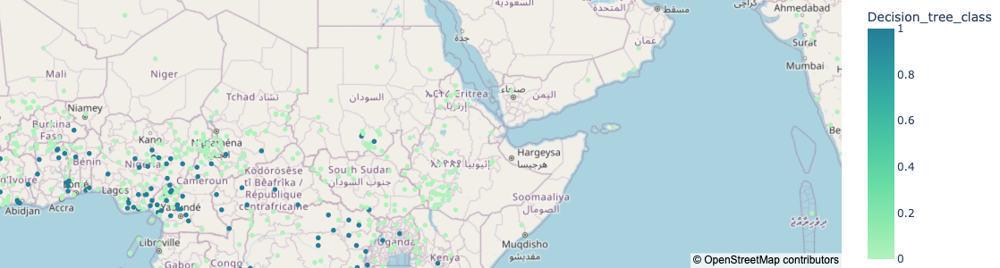

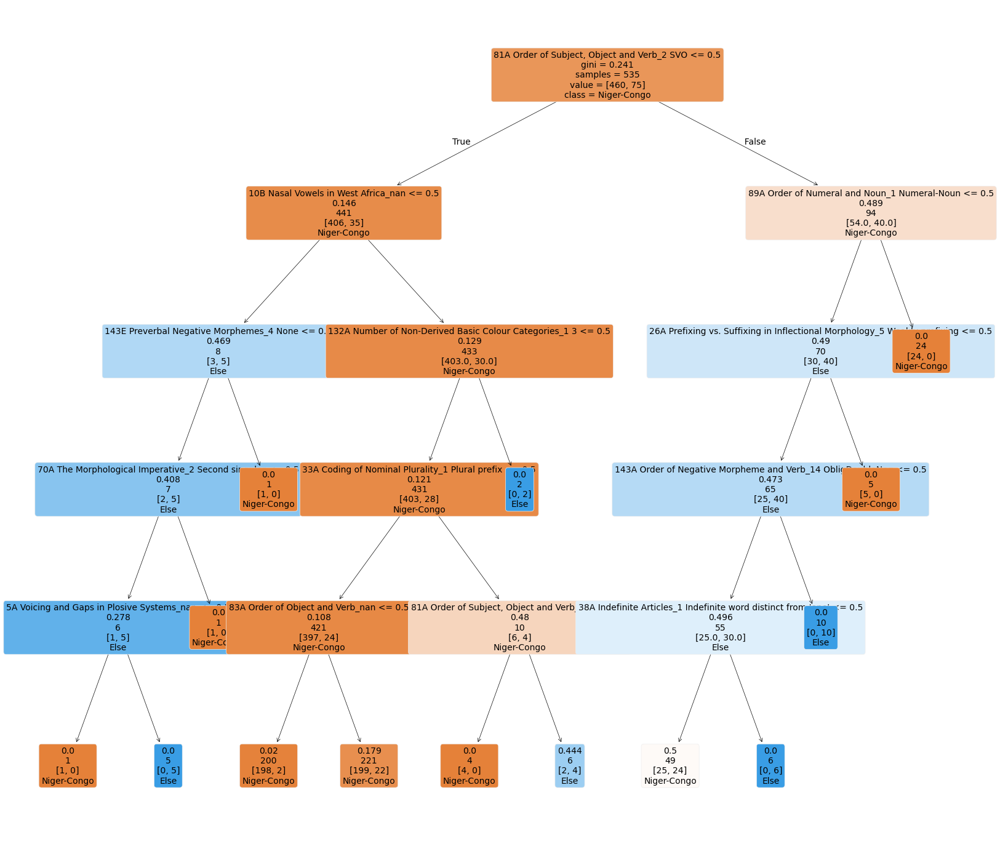

In [52]:
#Niger-Congo

print(np.mean(language_tree_accuracy('Niger-Congo',4,20)))

decisionTree = tree.DecisionTreeClassifier(max_depth=5)

decisionTree = decisionTree.fit(features, data['Niger-Congo'])

data['Decision_tree_class'] = decisionTree.predict(features)

fig = px.scatter_map(data,lat="latitude", lon="longitude", hover_name="Name", hover_data=["genus", "family",'Decision_tree_class'],
                        color = 'Decision_tree_class', zoom=3, height=300, color_continuous_scale=px.colors.sequential.Tealgrn)
fig.update_layout(map_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

draw_tree('Niger-Congo',5)

0.9087525282466173


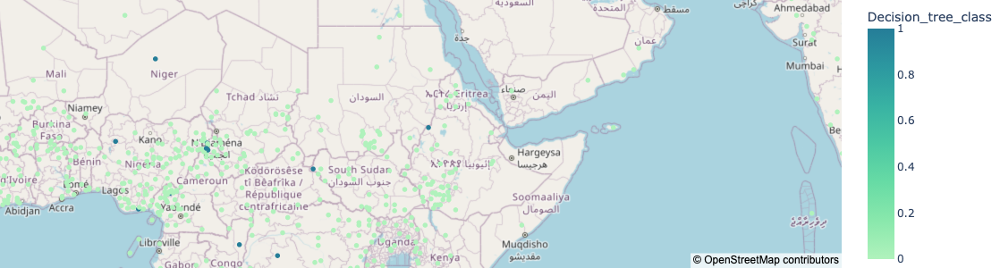

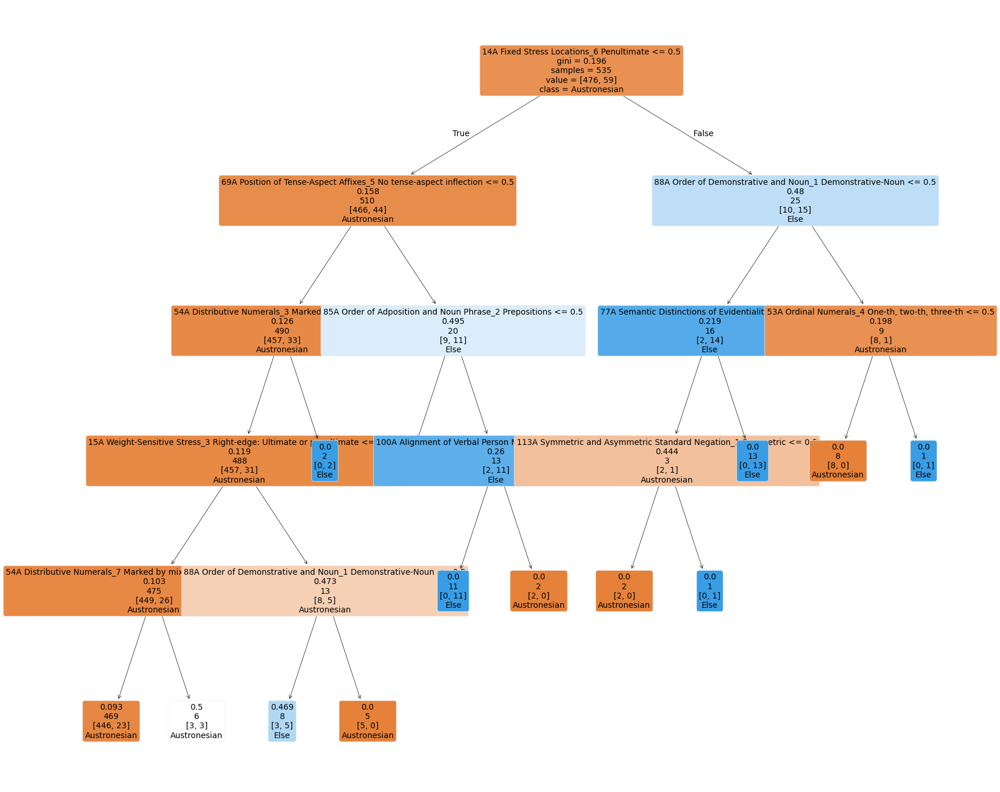

In [54]:
#Austronesian

print(np.mean(language_tree_accuracy('Austronesian',4,20)))

decisionTree = tree.DecisionTreeClassifier(max_depth=5)

decisionTree = decisionTree.fit(features, data['Austronesian'])

data['Decision_tree_class'] = decisionTree.predict(features)

fig = px.scatter_map(data,lat="latitude", lon="longitude", hover_name="Name", hover_data=["genus", "family",'Decision_tree_class'],
                        color = 'Decision_tree_class', zoom=3, height=300, color_continuous_scale=px.colors.sequential.Tealgrn)
fig.update_layout(map_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

draw_tree('Austronesian',5)

0.9500549239782397


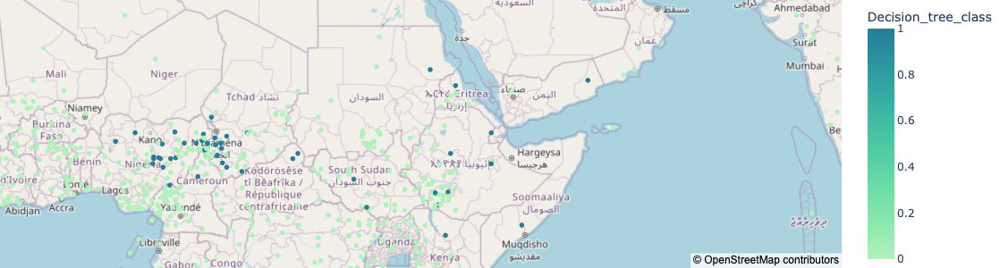

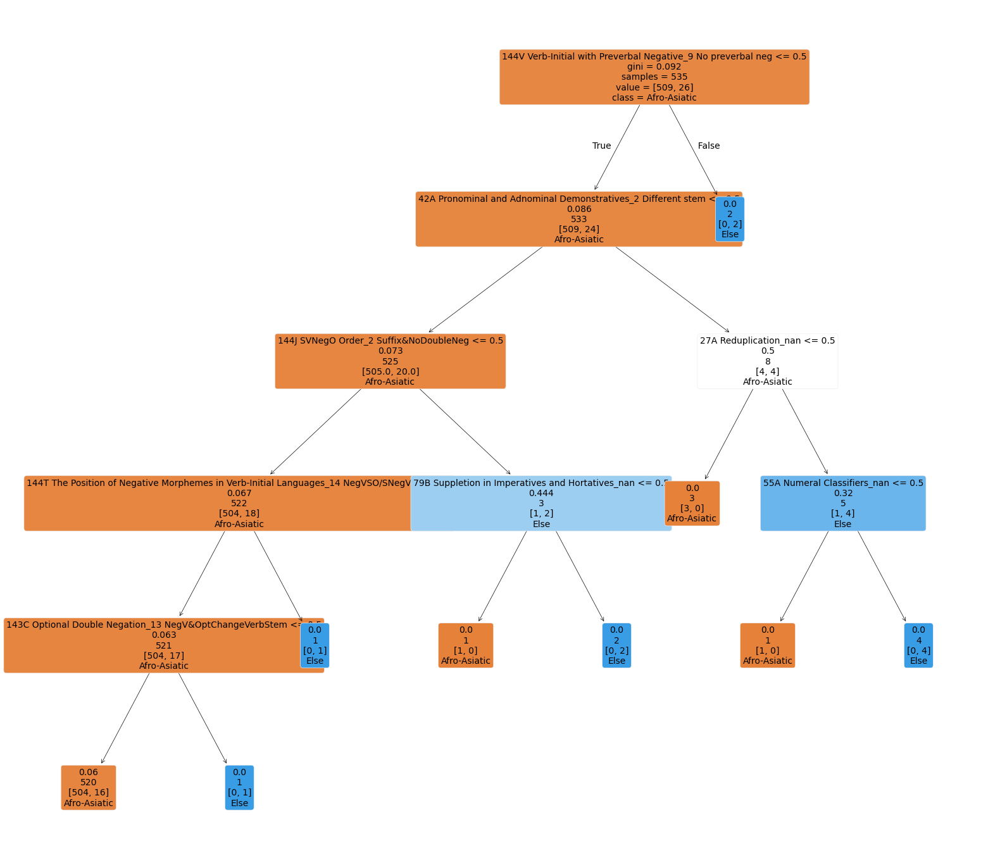

In [56]:
#Afro-Asiatic

print(np.mean(language_tree_accuracy('Afro-Asiatic',4,20)))

decisionTree = tree.DecisionTreeClassifier(max_depth=5)

decisionTree = decisionTree.fit(features, data['Afro-Asiatic'])

data['Decision_tree_class'] = decisionTree.predict(features)

fig = px.scatter_map(data,lat="latitude", lon="longitude", hover_name="Name", hover_data=["genus", "family",'Decision_tree_class'],
                        color = 'Decision_tree_class', zoom=3, height=300, color_continuous_scale=px.colors.sequential.Tealgrn)
fig.update_layout(map_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

draw_tree('Afro-Asiatic',5)

0.9689570546798716


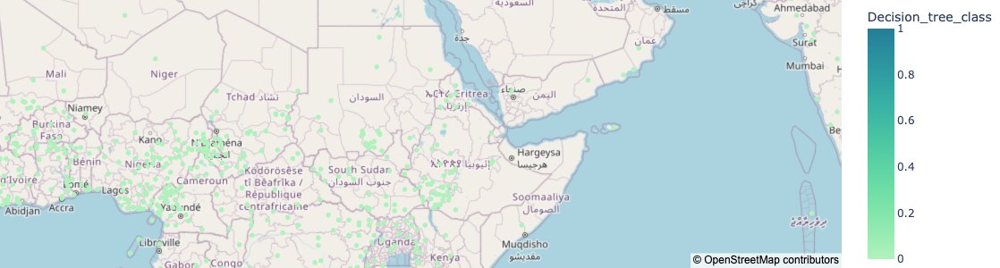

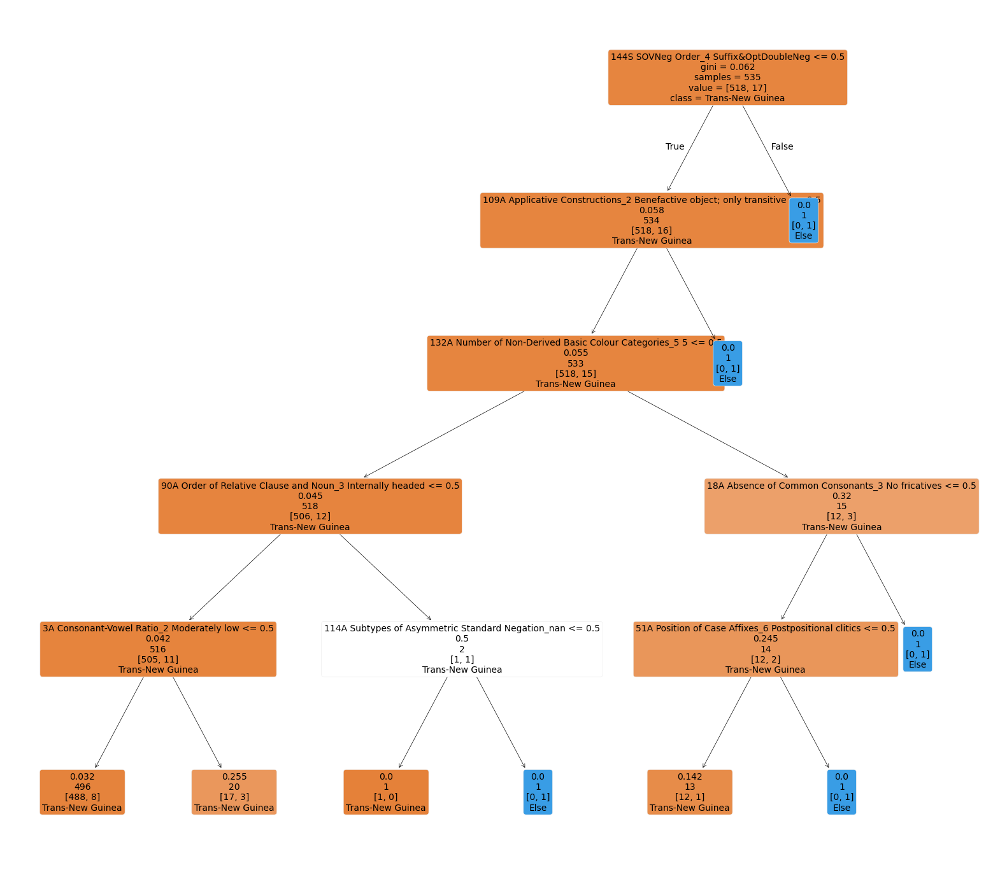

In [58]:
#Trans-New Guinea

print(np.mean(language_tree_accuracy('Trans-New Guinea',4,20)))

decisionTree = tree.DecisionTreeClassifier(max_depth=5)

decisionTree = decisionTree.fit(features, data['Trans-New Guinea'])

data['Decision_tree_class'] = decisionTree.predict(features)

fig = px.scatter_map(data,lat="latitude", lon="longitude", hover_name="Name", hover_data=["genus", "family",'Decision_tree_class'],
                        color = 'Decision_tree_class', zoom=3, height=300, color_continuous_scale=px.colors.sequential.Tealgrn)
fig.update_layout(map_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

draw_tree('Trans-New Guinea',5)

0.9906646673176176


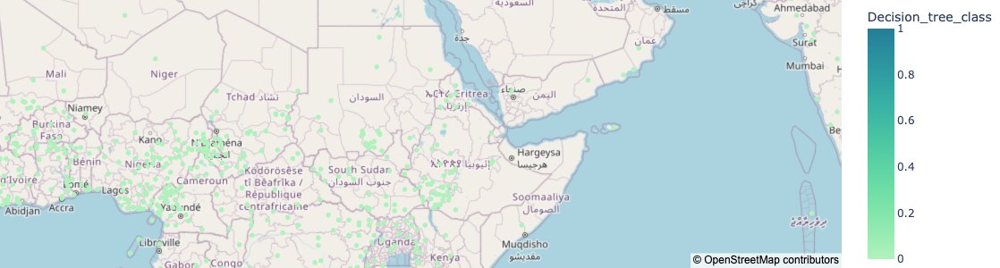

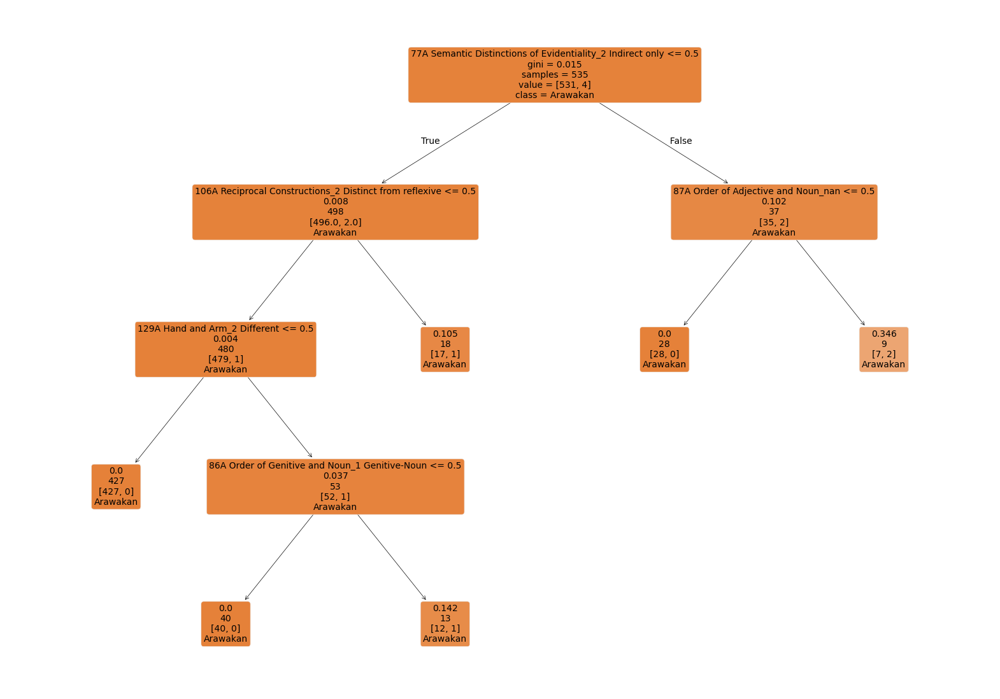

In [72]:
#Just for fun, I'd like to try Arawakan

print(np.mean(language_tree_accuracy('Arawakan',4,20)))

decisionTree = tree.DecisionTreeClassifier(max_depth=4,min_samples_split=20)

decisionTree = decisionTree.fit(features, data['Arawakan'])

data['Decision_tree_class'] = decisionTree.predict(features)

fig = px.scatter_map(data,lat="latitude", lon="longitude", hover_name="Name", hover_data=["genus", "family",'Decision_tree_class'],
                        color = 'Decision_tree_class', zoom=3, height=300, color_continuous_scale=px.colors.sequential.Tealgrn)
fig.update_layout(map_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

draw_tree('Arawakan',4,20)

**Just Phonology**

So what about something practical? Suppose you find yourself stranded on an island somewhere and you overhear the locals speaking a language you don't recognize. With an ear for phonology (the sounds of language), could you at least determine the family of the language you are hearing just from its sounds? Let's make a decision tree using just the phonological features, and see how well it works.

In [99]:
#Seperating out phonological_features…
phonological_features = ['1A Consonant Inventories_1 Small',
 '1A Consonant Inventories_2 Moderately small',
 '1A Consonant Inventories_3 Average',
 '1A Consonant Inventories_4 Moderately large',
 '1A Consonant Inventories_5 Large',
 '1A Consonant Inventories_nan',
 '2A Vowel Quality Inventories_1 Small (2-4)',
 '2A Vowel Quality Inventories_2 Average (5-6)',
 '2A Vowel Quality Inventories_3 Large (7-14)',
 '2A Vowel Quality Inventories_nan',
 '3A Consonant-Vowel Ratio_1 Low',
 '3A Consonant-Vowel Ratio_2 Moderately low',
 '3A Consonant-Vowel Ratio_3 Average',
 '3A Consonant-Vowel Ratio_4 Moderately high',
 '3A Consonant-Vowel Ratio_5 High',
 '3A Consonant-Vowel Ratio_nan',
 '4A Voicing in Plosives and Fricatives_1 No voicing contrast',
 '4A Voicing in Plosives and Fricatives_2 In plosives alone',
 '4A Voicing in Plosives and Fricatives_3 In fricatives alone',
 '4A Voicing in Plosives and Fricatives_4 In both plosives and fricatives',
 '4A Voicing in Plosives and Fricatives_nan',
 '5A Voicing and Gaps in Plosive Systems_1 Other',
 '5A Voicing and Gaps in Plosive Systems_2 None missing in /p t k b d g/',
 '5A Voicing and Gaps in Plosive Systems_3 Missing /p/',
 '5A Voicing and Gaps in Plosive Systems_4 Missing /g/',
 '5A Voicing and Gaps in Plosive Systems_5 Both missing',
 '5A Voicing and Gaps in Plosive Systems_nan',
 '6A Uvular Consonants_1 None',
 '6A Uvular Consonants_2 Uvular stops only',
 '6A Uvular Consonants_3 Uvular continuants only',
 '6A Uvular Consonants_4 Uvular stops and continuants',
 '6A Uvular Consonants_nan',
 '7A Glottalized Consonants_1 No glottalized consonants',
 '7A Glottalized Consonants_2 Ejectives only',
 '7A Glottalized Consonants_3 Implosives only',
 '7A Glottalized Consonants_4 Glottalized resonants only',
 '7A Glottalized Consonants_5 Ejectives and implosives',
 '7A Glottalized Consonants_6 Ejectives and glottalized resonants',
 '7A Glottalized Consonants_7 Implosives and glottalized resonants',
 '7A Glottalized Consonants_nan',
 '8A Lateral Consonants_1 No laterals',
 '8A Lateral Consonants_2 /l/, no obstruent laterals',
 '8A Lateral Consonants_3 Laterals, but no /l/, no obstruent laterals',
 '8A Lateral Consonants_4 /l/ and lateral obstruent',
 '8A Lateral Consonants_5 No /l/, but lateral obstruents',
 '8A Lateral Consonants_nan',
 '9A The Velar Nasal_1 Initial velar nasal',
 '9A The Velar Nasal_2 No initial velar nasal',
 '9A The Velar Nasal_3 No velar nasal',
 '9A The Velar Nasal_nan',
 '10A Vowel Nasalization_1 Contrast present',
 '10A Vowel Nasalization_2 Contrast absent',
 '10A Vowel Nasalization_nan',
 '11A Front Rounded Vowels_1 None',
 '11A Front Rounded Vowels_2 High and mid',
 '11A Front Rounded Vowels_3 High only',
 '11A Front Rounded Vowels_4 Mid only',
 '11A Front Rounded Vowels_nan',
 '12A Syllable Structure_1 Simple',
 '12A Syllable Structure_2 Moderately complex',
 '12A Syllable Structure_3 Complex',
 '12A Syllable Structure_nan',
 '13A Tone_1 No tones',
 '13A Tone_2 Simple tone system',
 '13A Tone_3 Complex tone system',
 '13A Tone_nan',
 '14A Fixed Stress Locations_1 No fixed stress',
 '14A Fixed Stress Locations_2 Initial',
 '14A Fixed Stress Locations_3 Second',
 '14A Fixed Stress Locations_5 Antepenultimate',
 '14A Fixed Stress Locations_6 Penultimate',
 '14A Fixed Stress Locations_7 Ultimate',
 '14A Fixed Stress Locations_nan',
 '15A Weight-Sensitive Stress_1 Left-edge: First or second',
 '15A Weight-Sensitive Stress_3 Right-edge: Ultimate or penultimate',
 '15A Weight-Sensitive Stress_4 Right-oriented: One of the last three',
 '15A Weight-Sensitive Stress_5 Unbounded: Stress can be anywhere',
 '15A Weight-Sensitive Stress_6 Combined: Right-edge and unbounded',
 '15A Weight-Sensitive Stress_7 Not predictable',
 '15A Weight-Sensitive Stress_8 Fixed stress (no weight-sensitivity)',
 '15A Weight-Sensitive Stress_nan',
 '16A Weight Factors in Weight-Sensitive Stress Systems_1 No weight',
 '16A Weight Factors in Weight-Sensitive Stress Systems_2 Long vowel',
 '16A Weight Factors in Weight-Sensitive Stress Systems_3 Coda consonant',
 '16A Weight Factors in Weight-Sensitive Stress Systems_4 Long vowel or coda consonant',
 '16A Weight Factors in Weight-Sensitive Stress Systems_5 Prominence',
 '16A Weight Factors in Weight-Sensitive Stress Systems_6 Lexical stress',
 '16A Weight Factors in Weight-Sensitive Stress Systems_7 Combined',
 '16A Weight Factors in Weight-Sensitive Stress Systems_nan',
 '17A Rhythm Types_1 Trochaic',
 '17A Rhythm Types_2 Iambic',
 '17A Rhythm Types_3 Dual: both trochaic and iambic',
 '17A Rhythm Types_4 Undetermined',
 '17A Rhythm Types_5 No rhythmic stress',
 '17A Rhythm Types_nan',
 '18A Absence of Common Consonants_1 All present',
 '18A Absence of Common Consonants_2 No bilabials',
 '18A Absence of Common Consonants_3 No fricatives',
 '18A Absence of Common Consonants_4 No nasals',
 '18A Absence of Common Consonants_nan',
 '19A Presence of Uncommon Consonants_1 None',
 '19A Presence of Uncommon Consonants_2 Clicks',
 '19A Presence of Uncommon Consonants_3 Labial-velars',
 '19A Presence of Uncommon Consonants_4 Pharyngeals',
 "19A Presence of Uncommon Consonants_5 'Th' sounds",
 '19A Presence of Uncommon Consonants_7 Pharyngeals and "th"',
 '19A Presence of Uncommon Consonants_nan']

#processing data
phonology = pd.concat([data['latitude'],data['longitude'],data['Name'],data['family'],data['genus'],data[largest_families],data[phonological_features]],axis=1)
phonology.head()

phon_features = phonology.loc[:,phonological_features]
phon_feature_names = phon_features.columns.to_list()

family_map = {'Sino-Tibetan':1, 'Trans-New Guinea':2, 'Indo-European':3, 'Niger-Congo':4, 'Austronesian':5, 'Afro-Asiatic':6}
family_map_inverted = {v: k for k, v in family_map.items()}
family_map_inverted.update({0: "Other"})

phonology["family_number"] = phonology["family"].map(family_map)
phonology["family_number"] = phonology["family_number"].fillna(0)

#the decision tree
decisionTree = tree.DecisionTreeClassifier(max_depth=10,min_samples_split=20)

decisionTree = decisionTree.fit(phon_features, phonology['family_number'])

y_pred = decisionTree.predict(phon_features)

phonology['Decision_tree_class'] = y_pred
phonology['Decision_tree_class'] = phonology['Decision_tree_class'].map(family_map_inverted)

print(metrics.accuracy_score(y_true = phonology['family_number'], y_pred = y_pred))

0.6028368794326241


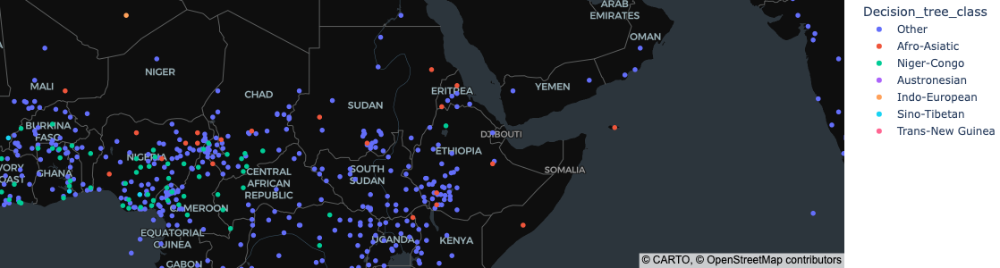

In [101]:
#Mapping it
fig = px.scatter_map(phonology,lat="latitude", lon="longitude", hover_name="Name", hover_data=["genus", "family",'Decision_tree_class'],
                        color = 'Decision_tree_class', zoom=3, height=300, color_discrete_sequence=px.colors.qualitative.Plotly)
fig.update_layout(map_style="dark")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [85]:
#And finally printing this sequoia-sized tree
print(tree.export_text(decisionTree, feature_names = phon_feature_names))

|--- 14A Fixed Stress Locations_6 Penultimate <= 0.50
|   |--- 9A The Velar Nasal_nan <= 0.50
|   |   |--- 5A Voicing and Gaps in Plosive Systems_3 Missing /p/ <= 0.50
|   |   |   |--- 9A The Velar Nasal_1 Initial velar nasal <= 0.50
|   |   |   |   |--- 6A Uvular Consonants_3 Uvular continuants only <= 0.50
|   |   |   |   |   |--- 16A Weight Factors in Weight-Sensitive Stress Systems_6 Lexical stress <= 0.50
|   |   |   |   |   |   |--- 19A Presence of Uncommon Consonants_5 'Th' sounds <= 0.50
|   |   |   |   |   |   |   |--- 5A Voicing and Gaps in Plosive Systems_1 Other <= 0.50
|   |   |   |   |   |   |   |   |--- 17A Rhythm Types_4 Undetermined <= 0.50
|   |   |   |   |   |   |   |   |   |--- 13A Tone_2 Simple tone system <= 0.50
|   |   |   |   |   |   |   |   |   |   |--- 15A Weight-Sensitive Stress_4 Right-oriented: One of the last three <= 0.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 5
|   |   |   |   |   |   |   |   |   |   |--- 15A Weight-S

Playing around with the maximum depth, accuracy seems to level off at around 60. That's not so bad, but not ideal. 

Where does it get confused? Looking around the map, there's some interesting stuff. Several language in New England are classified as Afro-Asiatic. It doesn't get English, Swedish, or any Indic languages besides Sindhi. Bikol—an Austronesian language of the Philippines—is classified as Indo-European; listening to it, it sounds quite like Tagalog to me. Japanese is classified as Indo-European? Let's get a confusion matrix to understand where the mistakes happen.

In [111]:
print(metrics.confusion_matrix(y_true = phonology['family_number'], y_pred = y_pred))

[[1410    1    0    5   17   26   10]
 [ 139    7    0    1    1    0    1]
 [  81    1    1    0    2    2    1]
 [ 146    0    0   21    0    4    5]
 [ 256    3    0    1   63    1    3]
 [ 226    1    1    7    0   88    2]
 [ 110    0    0    4    4    2   25]]


As I suspected, the tree classifies a lot of languages that belong to one of the largest families as 'other.' Perhaps this is related to smaller language's dearth of reported features. It is also safer to assume 'other,' since it is the largest category. That said, before running this experiment, I would have guessed you could be no more than 60% accurate in judging the language of a family by its phonology. More often, in my experience, phonology has a stronger relationship to geography (i.e. the nearest languages). Since geography and family are correlated to a degree, I wonder if we could parse family from geography and examine the contribution of each factor. Something to think about for another project!

**One last thing…**

Like above, let's use all features and each of the large families, all at once.

In [116]:
#All major families at once?

data["family_number"] = data["family"].map(family_map)
data["family_number"] = data["family_number"].fillna(0)

decisionTree = tree.DecisionTreeClassifier(max_depth=10,min_samples_split=30)

decisionTree = decisionTree.fit(features, data['family_number'])

y_pred = decisionTree.predict(features)

data['Decision_tree_class'] = y_pred
data['Decision_tree_class'] = data['Decision_tree_class'].map(family_map_inverted)

print(metrics.accuracy_score(y_true = data['family_number'], y_pred = y_pred))

0.703994027622247


In [120]:
#Decent accuracy. Lets print the tree.
print(tree.export_text(decisionTree, feature_names = feature_names))

|--- 81A Order of Subject, Object and Verb_2 SVO <= 0.50
|   |--- 129A Hand and Arm_2 Different <= 0.50
|   |   |--- 83A Order of Object and Verb_1 OV <= 0.50
|   |   |   |--- 14A Fixed Stress Locations_6 Penultimate <= 0.50
|   |   |   |   |--- 9A The Velar Nasal_nan <= 0.50
|   |   |   |   |   |--- 144J SVNegO Order_7 No SVNegO <= 0.50
|   |   |   |   |   |   |--- 5A Voicing and Gaps in Plosive Systems_3 Missing /p/ <= 0.50
|   |   |   |   |   |   |   |--- 75A Epistemic Possibility_1 Verbal constructions <= 0.50
|   |   |   |   |   |   |   |   |--- 34A Occurrence of Nominal Plurality_2 Only human nouns, optional <= 0.50
|   |   |   |   |   |   |   |   |   |--- 66A The Past Tense_2 Present, 2-3 remoteness distinctions <= 0.50
|   |   |   |   |   |   |   |   |   |   |--- class: 0.0
|   |   |   |   |   |   |   |   |   |--- 66A The Past Tense_2 Present, 2-3 remoteness distinctions >  0.50
|   |   |   |   |   |   |   |   |   |   |--- class: 3.0
|   |   |   |   |   |   |   |   |--- 34A Occ

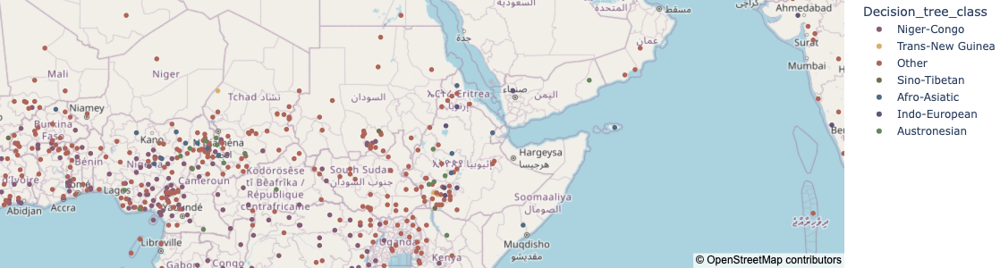

In [122]:
#And the map
fig = px.scatter_map(data,lat="latitude", lon="longitude", hover_name="Name", hover_data=["genus", "family",'Decision_tree_class'],
                        color = 'Decision_tree_class', zoom=3, height=300, color_discrete_sequence=px.colors.qualitative.Antique)
fig.update_layout(map_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [124]:
#Finally, the confusion matrix
print(metrics.confusion_matrix(y_true = data['family_number'], y_pred = y_pred))

[[1378    9   23   14   18   22    5]
 [  56   68    9   12    0    4    0]
 [  48    3   36    0    0    0    1]
 [  97    2    0   71    1    5    0]
 [ 141    1    0    1  174    9    1]
 [ 171    1    3    5    5  139    1]
 [  89    2    3    8    5   18   20]]


The model has the same issues as using phonology, but it works somewhat better. 70% is not bad, but I would have expected a bigger improvement from considering the grammatical features.